In [ ]:
### Questo notebook contiene uno script che mostra alcuni esempi di canzoni con le top 3 immagini per cosine similarities, le cosine con punteggio piu alto e le immagini piu presenti.
##Inoltre salva le cosine in un csv


Caricamento dati RGB pre-calcolati...
Caricati 100 elementi da /kaggle/input/testtest/valutazione_rgb_segmenti (10) (1).csv
Caricati 100 elementi da /kaggle/input/immagini-con-samp/valutazione_rgb_immagini 0.1 samp.csv
Caricamento completato.

Selezionate 10 canzoni per la dimostrazione.
Calcolo similarità coseno tra tutte le canzoni e salvataggio in CSV...
Similarità canzone-canzone salvate in 'similarita_canzoni.csv'


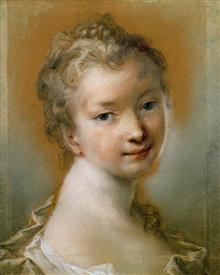


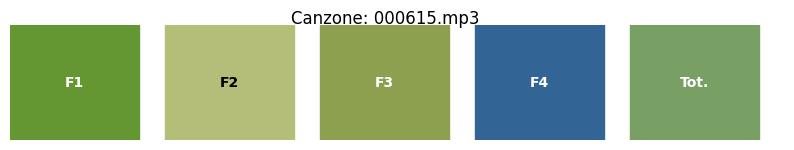


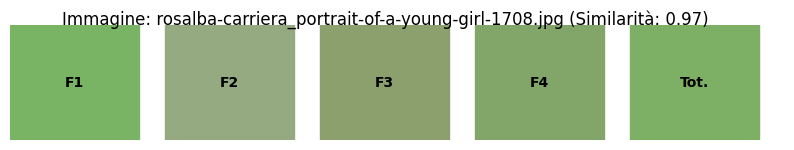

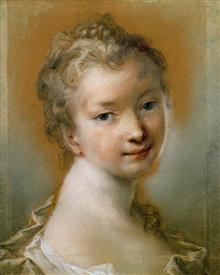


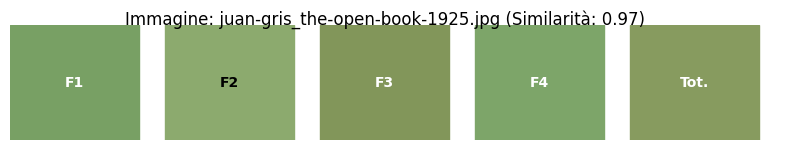

...


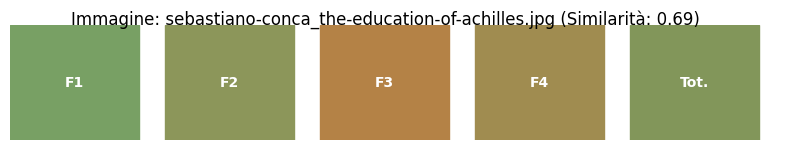

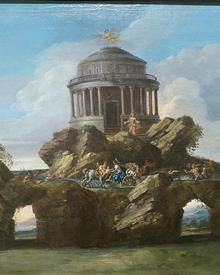

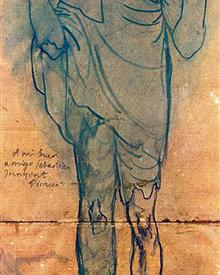

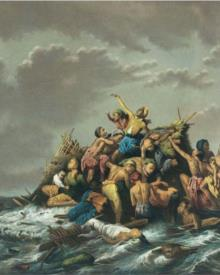

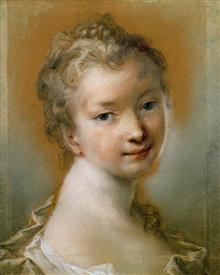

In [2]:
import csv
import re
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from IPython.display import display, Audio, Image as IpyImage, HTML
import base64
from io import BytesIO
import random
from sklearn.metrics.pairwise import cosine_similarity
from collections import Counter

# --- CONFIGURAZIONE ---
NUM_CANZONI_DA_MOSTARE = 10 # Quante canzoni mostrare nella sezione dimostrativa
TOP_IMMAGINI_PER_CANZONE = 3 # Quante immagini abbinare per ogni canzone dimostrativa

PERCORSO_CANZONI_AUDIO = '/kaggle/input/le-musiche/000'
PERCORSO_IMMAGINI_VISIVE = '/kaggle/input/images100/images100'
FILE_RGB_CANZONI = '/kaggle/input/testtest/valutazione_rgb_segmenti (10) (1).csv'
FILE_RGB_IMMAGINI = '/kaggle/input/immagini-con-samp/valutazione_rgb_immagini 0.1 samp.csv'
OUTPUT_CSV_SIMILARITA_CANZONI = 'similarita_canzoni.csv' # File CSV per le similarità canzone-canzone

# --- Variabili per il miglior abbinamento globale canzone-immagine ---
best_match_song = None
best_match_image = None
highest_cosine_similarity = -1.0

# --- LEGENDA SEMPLIFICATA DEI COLORI E EMOZIONI ---
display(HTML("""
<style>
    .container {
        font-family: 'Helvetica', sans-serif;
        line-height: 1.6;
    }
    .legend-item {
        margin: 10px 0;
        padding: 8px;
        border-radius: 5px;
    }
    .emotion-title {
        font-weight: bold;
        margin-bottom: 5px;
    }
</style>

<div class="container">
<h3>🎨 Mappatura Emozioni-Colori (output di Qwen-3)</h3>
<p>I vettori RGB a 15 dimensioni (4 frammenti + 1 descrizione totale) rappresentano il mood emotivo, tradotto da Qwen-3 a partire dalle descrizioni di Qwen-VL.</p>
<div class="legend-item" style="background-color: rgba(255,50,50,0.1);">
    <div class="emotion-title">🔴 ROSSO (R) - Agitazione</div>
    <div>Energia, movimento, passione intensa</div>
</div>
<div class="legend-item" style="background-color: rgba(50,255,50,0.1);">
    <div class="emotion-title">🟢 VERDE (G) - Calma</div>
    <div>Equilibrio, natura, crescita serena</div>
</div>
<div class="legend-item" style="background-color: rgba(50,50,255,0.1);">
    <div class="emotion-title">🔵 BLU (B) - Tristezza</div>
    <div>Profondità, riflessione, malinconia</div>
</div>
<div class="legend-item">
    <div class="emotion-title">Combinazioni (esempi):</div>
    <div>🟡 Giallo (R+G): Gioia<br>
    🟠 Arancione (R+): Entusiasmo<br>
    🟣 Viola (R+B): Mistero<br>
    💖 Rosa: Tenerezza<br>
    💠 Turchese (G+B): Serenità</div>
</div>
</div>
"""))

# --- FUNZIONI BASE ---
def parse_rgb(rgb_str):
    """
    Parsa una stringa RGB del tipo 'rgb(R, G, B)' e restituisce una lista di interi [R, G, B].
    Ritorna [0, 0, 0] se la stringa non è valida.
    """
    if not rgb_str:
        return [0, 0, 0]
    match = re.search(r'rgb\((\d+),\s*(\d+),\s*(\d+)\)', rgb_str)
    return list(map(int, match.groups())) if match else [0, 0, 0]

def carica_dati_rgb(percorso, is_canzone=True):
    """
    Carica i dati RGB da un file CSV, adattandosi agli header per canzoni o immagini.
    """
    dati = {}
    with open(percorso, 'r', newline='') as f:
        reader = csv.DictReader(f)
        for riga in reader:
            if is_canzone:
                chiave = riga['Song Name']
                fragment_prefix = 'Frammento'
                total_description_col = 'Descrizione Totale'
            else: # Per le immagini
                chiave = riga['Image Name']
                fragment_prefix = 'Fragment'
                total_description_col = 'Total Description RGB'
            
            vettore_rgb_completo = []
            
            for i in range(1, 5):
                # Costruisce il nome della colonna in base al tipo (canzone/immagine)
                col_name = f'{fragment_prefix} {i}{" RGB" if not is_canzone else ""}'
                vettore_rgb_completo.extend(parse_rgb(riga.get(col_name, '')))
            
            vettore_rgb_completo.extend(parse_rgb(riga.get(total_description_col, '')))
            
            if len(vettore_rgb_completo) == 15:
                dati[chiave] = vettore_rgb_completo
            else:
                print(f"Avviso: Vettore RGB di dimensione inattesa per '{chiave}'. Atteso 15, trovato {len(vettore_rgb_completo)}. Saltato.")
    print(f"Caricati {len(dati)} elementi da {percorso}")
    return dati

def interpreta_emozione(r, g, b):
    """
    Interpreta un singolo colore RGB (non il vettore intero) in un'emozione semplificata.
    """
    if r > 200 and g < 100 and b < 100: return "Agitazione intensa 🔥"
    if g > 200 and r < 100 and b < 100: return "Calma profonda 🌿"
    if b > 200 and r < 100 and g < 100: return "Tristezza profonda 💧"
    
    if r > 180 and g > 180 and b < 100: return "Gioia radiosa 😄"
    if r > 200 and g > 100 and b < 50: return "Entusiasmo ✨"
    if r > 150 and b > 150 and g < 100: return "Mistico 🔮"
    if r > 200 and g > 150 and b > 150: return "Tenerezza 💖"
    if g > 150 and b > 150 and r < 100: return "Serenità 🌊"
    
    if (r + g + b) / 3 < 50: return "Profondità/Mistero ⚫"
    if (r + g + b) / 3 > 200: return "Luminosità/Positività ⚪"
    
    return "Equilibrio/Neutro ⚖️"

# --- FUNZIONI DI VISUALIZZAZIONE ---
def crea_anteprima_colori(colori_rgb_list, titolo):
    """
    Crea un'anteprima visiva dei colori per i 5 segmenti (4 frammenti + totale).
    """
    fig, ax = plt.subplots(figsize=(10, 1.5))
    fig.suptitle(titolo, fontsize=12)
    
    for i, (r, g, b) in enumerate(colori_rgb_list):
        colore = (r/255, g/255, b/255)
        label = f"F{i+1}" if i < 4 else "Tot."
        ax.add_patch(Rectangle((i*1.2, 0), 1, 1, color=colore))
        ax.text(i*1.2 + 0.5, 0.5, label, 
                ha='center', va='center',
                color='white' if r+g+b < 400 else 'black',
                fontsize=10, weight='bold')
    
    ax.set_xlim(0, len(colori_rgb_list)*1.2)
    ax.set_ylim(0, 1)
    ax.axis('off')
    
    buf = BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight', dpi=100)
    plt.close(fig)
    buf.seek(0)
    return base64.b64encode(buf.read()).decode('utf-8')

def mostra_emozioni(colori_rgb_list, tipo):
    """
    Mostra una tabella HTML con l'interpretazione emotiva di ogni segmento.
    """
    html = f"<div style='margin:15px 0;'><b>Emozioni {tipo}:</b><ul>"
    for i, (r, g, b) in enumerate(colori_rgb_list):
        emozione = interpreta_emozione(r, g, b)
        segment_label = f"Frammento {i+1}" if i < 4 else "Descrizione Totale"
        html += f"<li>{segment_label}: {emozione} (RGB({r},{g},{b}))</li>"
    html += "</ul></div>"
    display(HTML(html))

# --- CARICAMENTO DATI RGB PRE-CALCOLATI ---
print("Caricamento dati RGB pre-calcolati...")
canzoni_rgb_data = carica_dati_rgb(FILE_RGB_CANZONI, True)
immagini_rgb_data = carica_dati_rgb(FILE_RGB_IMMAGINI, False)
print("Caricamento completato.")

# --- SELEZIONE MIRATA DELLE CANZONI PER LA DIMOSTRAZIONE ---
# Seleziona un sottoinsieme di canzoni per la visualizzazione, cercando di massimizzare la diversità.
canzoni_selezionate = []
if canzoni_rgb_data:
    # Inizia con una canzone casuale
    first_song = random.choice(list(canzoni_rgb_data.keys()))
    canzoni_selezionate.append(first_song)
    
    # Seleziona altre canzoni cercando di essere il più "lontano" possibile da quelle già selezionate
    while len(canzoni_selezionate) < NUM_CANZONI_DA_MOSTARE and len(canzoni_selezionate) < len(canzoni_rgb_data):
        max_dist = -1
        best_candidate = None
        
        remaining_songs = [s for s in canzoni_rgb_data.keys() if s not in canzoni_selezionate]
        
        if not remaining_songs:
            break

        for candidate_song in remaining_songs:
            candidate_rgb = np.array(canzoni_rgb_data[candidate_song])
            
            min_dist_to_selected = float('inf')
            for selected_song in canzoni_selezionate:
                selected_rgb = np.array(canzoni_rgb_data[selected_song])
                dist = np.linalg.norm(candidate_rgb - selected_rgb) # Usiamo distanza euclidea per la selezione
                min_dist_to_selected = min(min_dist_to_selected, dist)
            
            if min_dist_to_selected > max_dist:
                max_dist = min_dist_to_selected
                best_candidate = candidate_song
        
        if best_candidate:
            canzoni_selezionate.append(best_candidate)
            
    canzoni_esempio = canzoni_selezionate
else:
    print("Nessuna canzone caricata. Impossibile procedere.")
    canzoni_esempio = []
    
print(f"\nSelezionate {len(canzoni_esempio)} canzoni per la dimostrazione.")
if not canzoni_esempio:
    print("Errore: Nessuna canzone selezionata per la dimostrazione. Controlla i percorsi e i dati CSV.")




### Calcolo e Salvataggio CSV delle Similarità
print("Calcolo similarità coseno tra tutte le canzoni e salvataggio in CSV...")

canzoni_nomi_lista = list(canzoni_rgb_data.keys())
canzoni_vectors_2d = np.array(list(canzoni_rgb_data.values()))

similarita_canzoni_output = []

# Scrive l'header del CSV
header = ['Canzone Origine',
          'Migliore 1 (Canzone, Similarità)', 'Migliore 2 (Canzone, Similarità)', 'Migliore 3 (Canzone, Similarità)',
          'Peggiore 1 (Canzone, Similarità)', 'Peggiore 2 (Canzone, Similarità)', 'Peggiore 3 (Canzone, Similarità)']
similarita_canzoni_output.append(header)

for i, canzone_origine_nome in enumerate(canzoni_nomi_lista):
    v_origine = canzoni_vectors_2d[i].reshape(1, -1)
    
    # Calcola la similarità coseno con tutte le altre canzoni
    similarities = cosine_similarity(v_origine, canzoni_vectors_2d)[0]
    
    canzone_similarita_list = []
    for j, sim_score in enumerate(similarities):
        if i != j: # Escludi la similarità con se stessa (che sarebbe 1.0)
            canzone_similarita_list.append((canzoni_nomi_lista[j], sim_score))
            
    # Ordina per similarità decrescente per trovare le migliori
    canzone_similarita_list.sort(key=lambda x: x[1], reverse=True)
    migliori_3 = canzone_similarita_list[:3]
    
    # Ordina per similarità crescente per trovare le peggiori
    canzone_similarita_list.sort(key=lambda x: x[1])
    peggiori_3 = canzone_similarita_list[:3]
    
    row = [canzone_origine_nome]
    for canzone, sim in migliori_3:
        row.append(f"{canzone} ({sim:.3f})")
    for canzone, sim in peggiori_3:
        row.append(f"{canzone} ({sim:.3f})")
    similarita_canzoni_output.append(row)

# Scrivi i risultati nel file CSV
with open(OUTPUT_CSV_SIMILARITA_CANZONI, 'w', newline='', encoding='utf-8') as f:
    writer = csv.writer(f)
    writer.writerows(similarita_canzoni_output)

print(f"Similarità canzone-canzone salvate in '{OUTPUT_CSV_SIMILARITA_CANZONI}'")




### Calcolo Abbinamenti e Aggiornamento Miglior Match
risultati_abbinamento = {}
immagini_nomi = list(immagini_rgb_data.keys())
immagini_vectors_2d = np.array(list(immagini_rgb_data.values()))
immagini_abbinate_frequentemente = Counter() # Inizializza il contatore

for canzone_nome in canzoni_esempio:
    v_canzone = np.array(canzoni_rgb_data[canzone_nome]).reshape(1, -1)
    
    similarities = cosine_similarity(v_canzone, immagini_vectors_2d)[0]
    
    similarita_list = []
    for i, sim_score in enumerate(similarities):
        similarita_list.append((immagini_nomi[i], sim_score))
        
        # AGGIORNAMENTO: Trova la similarità coseno più alta in assoluto
        if sim_score > highest_cosine_similarity:
            highest_cosine_similarity = sim_score
            best_match_song = canzone_nome
            best_match_image = immagini_nomi[i]
    
    similarita_list.sort(key=lambda x: x[1], reverse=True)
    risultati_abbinamento[canzone_nome] = similarita_list[:TOP_IMMAGINI_PER_CANZONE]

    # Aggiorna il contatore delle immagini abbinate per la sezione "immagini più frequenti"
    for img_nome, _ in risultati_abbinamento[canzone_nome]:
        immagini_abbinate_frequentemente[img_nome] += 1

### Stampa del Miglior Abbinamento Mood Globale
display(HTML("<h3 style='color:#28a745; margin-top:30px;'>🏆 Miglior Abbinamento Mood Trovato (Globalmente) 🏆</h3>"))

if best_match_song and best_match_image and highest_cosine_similarity != -1.0:
    display(HTML(f"<p><b>Similarità Coseno Più Alta:</b> {highest_cosine_similarity:.3f}</p>"))
    display(HTML(f"<p><b>Canzone di Riferimento:</b> {best_match_song}</p>"))
    
    # Tenta di riprodurre l'audio della canzone di riferimento
    percorso_audio_best = os.path.join(PERCORSO_CANZONI_AUDIO, best_match_song)
    if os.path.exists(percorso_audio_best):
        display(Audio(percorso_audio_best))
    else:
        display(HTML(f"<div style='color:red;'>File audio '{best_match_song}' non trovato nel percorso: {percorso_audio_best}</div>"))

    display(HTML(f"<p><b>Immagine Abbinata:</b> {best_match_image}</p>"))
    
    # Mostra l'immagine di riferimento
    percorso_img_best = os.path.join(PERCORSO_IMMAGINI_VISIVE, best_match_image)
    if os.path.exists(percorso_img_best):
        display(IpyImage(filename=percorso_img_best, width=300))
    else:
        display(HTML(f"<div style='color:red;'>File immagine '{best_match_image}' non trovato nel percorso: {percorso_img_best}</div>"))
    
    display(HTML("<hr style='margin:40px 0; border-top: 2px dashed #ccc;'>"))
else:
    display(HTML("<p>Nessun abbinamento significativo trovato o dati insufficienti.</p>"))


### Visualizzazione Dettagliata per Canzone
if not canzoni_esempio:
    display(HTML("<p style='color:red;'>Nessuna canzone valida da mostrare per la dimostrazione.</p>"))
else:
    for canzone_nome, immagini_abbinate in risultati_abbinamento.items():
        colori_canzone_segmenti = [tuple(canzoni_rgb_data[canzone_nome][i:i+3]) for i in range(0, 15, 3)]
        img_anteprima_canzone_colors = crea_anteprima_colori(colori_canzone_segmenti, f"Canzone: {canzone_nome}")
        
        display(HTML(f"<h3 style='color:#1e88e5; margin-top:30px;'>🎧 Canzone: {canzone_nome}</h3>"))
        display(HTML(f"<img src='data:image/png;base64,{img_anteprima_canzone_colors}'>"))
        mostra_emozioni(colori_canzone_segmenti, "della Canzone")
        
        percorso_audio = os.path.join(PERCORSO_CANZONI_AUDIO, canzone_nome)
        if os.path.exists(percorso_audio):
            display(Audio(percorso_audio))
        else:
            display(HTML(f"<div style='color:red;'>File audio '{canzone_nome}' non trovato nel percorso specificato: {PERCORSO_CANZONI_AUDIO}</div>"))
        
        display(HTML("<h4 style='margin-top:20px;'>🖼️ Immagini abbinate per mood (top 3):</h4>"))
        for i, (img_nome, sim_score) in enumerate(immagini_abbinate, 1):
            colori_immagine_segmenti = [tuple(immagini_rgb_data[img_nome][i:i+3]) for i in range(0, 15, 3)]
            img_anteprima_image_colors = crea_anteprima_colori(colori_immagine_segmenti, f"Immagine: {img_nome} (Similarità: {sim_score:.2f})")
            
            display(HTML(f"<h5>#{i}: {img_nome} (Similarità coseno: {sim_score:.3f})</h5>"))
            display(HTML(f"<img src='data:image/png;base64,{img_anteprima_image_colors}' style='margin-bottom:10px;'>"))
            mostra_emozioni(colori_immagine_segmenti, "dell'Immagine")
            
            percorso_img = os.path.join(PERCORSO_IMMAGINI_VISIVE, img_nome)
            if os.path.exists(percorso_img):
                display(IpyImage(filename=percorso_img, width=300))
            else:
                display(HTML(f"<div style='color:red;'>File immagine '{img_nome}' non trovato nel percorso specificato: {PERCORSO_IMMAGINI_VISIVE}</div>"))
        
        display(HTML("<hr style='margin:40px 0;'>"))



### Visualizzazione delle 3 Immagini Più Frequenti
if immagini_abbinate_frequentemente:
    top_3_immagini = immagini_abbinate_frequentemente.most_common(3)
    display(HTML("<p>Queste sono le 3 immagini che sono apparse più spesso tra gli abbinamenti delle canzoni selezionate:</p>"))
    display(HTML("<div style='display:flex; justify-content:space-around; flex-wrap:wrap;'>"))
    for img_name, count in top_3_immagini:
        percorso_img_frequente = os.path.join(PERCORSO_IMMAGINI_VISIVE, img_name)
        display(HTML(f"<div style='text-align:center; margin:10px; border:1px solid #ddd; padding:10px; border-radius:8px;'>"))
        display(HTML(f"<b>{img_name}</b><br>(Appare {count} volte)<br>"))
        if os.path.exists(percorso_img_frequente):
            display(IpyImage(filename=percorso_img_frequente, width=200))
        else:
            display(HTML(f"<div style='color:red;'>Immagine non trovata.</div>"))
        display(HTML("</div>"))
    display(HTML("</div>"))
else:
    display(HTML("<p>Nessuna immagine trovata negli abbinamenti.</p>"))

Caricamento dati RGB...
Caricate 100 canzoni e 100 immagini

Calcolo abbinamenti 1:1 in ordine di similarità...
Trovati 100 abbinamenti 1:1

VERIFICA UNIVOCITÀ: SUCCESSO
- Numero abbinamenti: 100
- Canzoni uniche: 100
- Immagini uniche: 100

Classifica salvata in 'classifica_abbinamenti_canzoni_immagini.csv'


Pos,Similarità,Canzone,Immagine
1,0.9987,000211.mp3,lucian-freud_naked-man-with-his-friend.jpg
2,0.9987,005157.mp3,juan-gris_the-open-book-1925.jpg
3,0.9979,025601.mp3,nikolay-bogdanov-belsky_country-boys-1.jpg
4,0.9975,000203.mp3,luis-feito_n-mero-148-1959.jpg
5,0.9975,005156.mp3,pierre-tal-coat_self-portrait.jpg
6,0.9971,005159.mp3,pierre-auguste-renoir_portrait-of-a-girl-1880.jpg
7,0.9969,000210.mp3,pierre-tal-coat_untitled-1975-1.jpg
8,0.9968,005169.mp3,nikolay-bogdanov-belsky_cowboy-2.jpg
9,0.9964,005170.mp3,william-henry-huddle_portrait-of-madam-candelaria-1891.jpg
10,0.9958,000194.mp3,richard-jack_river-scene-with-jetty.jpg


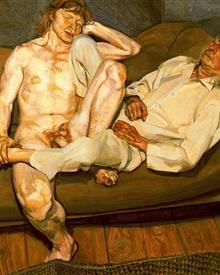

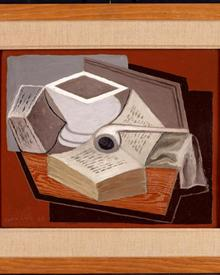

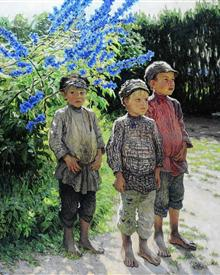

In [4]:
import csv
import re
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from IPython.display import display, Audio, Image as IpyImage, HTML
import base64
from io import BytesIO
from sklearn.metrics.pairwise import cosine_similarity
from collections import defaultdict

# --- CONFIGURAZIONE ---
PERCORSO_CANZONI_AUDIO = '/kaggle/input/le-musiche/000'
PERCORSO_IMMAGINI_VISIVE = '/kaggle/input/images100/images100'
FILE_RGB_CANZONI = '/kaggle/input/testtest/valutazione_rgb_segmenti (10) (1).csv'
FILE_RGB_IMMAGINI = '/kaggle/input/immagini-con-samp/valutazione_rgb_immagini 0.1 samp.csv'
OUTPUT_MAPPING_CSV = 'classifica_abbinamenti_canzoni_immagini.csv'

# --- FUNZIONI BASE ---
def parse_rgb(rgb_str):
    match = re.search(r'rgb\((\d+),\s*(\d+),\s*(\d+)\)', rgb_str)
    return list(map(int, match.groups())) if match else [0, 0, 0]

def carica_dati_rgb(percorso, is_canzone=True):
    dati = {}
    with open(percorso, 'r', newline='') as f:
        reader = csv.DictReader(f)
        for riga in reader:
            if is_canzone:
                chiave = riga['Song Name']
                fragment_prefix = 'Frammento'
                total_description_col = 'Descrizione Totale'
            else:
                chiave = riga['Image Name']
                fragment_prefix = 'Fragment'
                total_description_col = 'Total Description RGB'
            
            vettore_rgb_completo = []
            
            for i in range(1, 5):
                col_name = f'{fragment_prefix} {i}{" RGB" if not is_canzone else ""}'
                vettore_rgb_completo.extend(parse_rgb(riga.get(col_name, '')))
            
            vettore_rgb_completo.extend(parse_rgb(riga.get(total_description_col, '')))
            
            if len(vettore_rgb_completo) == 15:
                dati[chiave] = vettore_rgb_completo
    return dati

# --- CARICAMENTO DATI ---
print("Caricamento dati RGB...")
canzoni_rgb_data = carica_dati_rgb(FILE_RGB_CANZONI, True)
immagini_rgb_data = carica_dati_rgb(FILE_RGB_IMMAGINI, False)
print(f"Caricate {len(canzoni_rgb_data)} canzoni e {len(immagini_rgb_data)} immagini")

# --- CALCOLO MAPPING 1:1 ---
print("\nCalcolo abbinamenti 1:1 in ordine di similarità...")

# Preparazione dati
tutte_canzoni = list(canzoni_rgb_data.keys())
tutte_immagini = list(immagini_rgb_data.keys())
vettori_canzoni = np.array([canzoni_rgb_data[s] for s in tutte_canzoni])
vettori_immagini = np.array([immagini_rgb_data[i] for i in tutte_immagini])

# Calcolo matrice di similarità
matrice_similarita = cosine_similarity(vettori_canzoni, vettori_immagini)

# Creazione lista di tutte le possibili coppie
tutte_coppie = []
for i, canzone in enumerate(tutte_canzoni):
    for j, immagine in enumerate(tutte_immagini):
        sim = matrice_similarita[i][j]
        tutte_coppie.append((sim, canzone, immagine))

# Ordina per similarità decrescente
tutte_coppie.sort(key=lambda x: x[0], reverse=True)

# Assegnazione 1:1 con verifica univocità
abbinamenti = []
immagini_assegnate = set()
canzoni_assegnate = set()

for sim, canzone, immagine in tutte_coppie:
    if canzone not in canzoni_assegnate and immagine not in immagini_assegnate:
        abbinamenti.append((sim, canzone, immagine))
        immagini_assegnate.add(immagine)
        canzoni_assegnate.add(canzone)
        
        if len(abbinamenti) == min(len(tutte_canzoni), len(tutte_immagini)):
            break

# Ordina gli abbinamenti per similarità
abbinamenti.sort(key=lambda x: x[0], reverse=True)
print(f"Trovati {len(abbinamenti)} abbinamenti 1:1")

# --- VERIFICA UNIVOCITÀ ---
canzoni_controllo = set()
immagini_controllo = set()

for _, canzone, immagine in abbinamenti:
    canzoni_controllo.add(canzone)
    immagini_controllo.add(immagine)

is_univoco = (len(canzoni_controllo) == len(abbinamenti) and 
              len(immagini_controllo) == len(abbinamenti))

print(f"\nVERIFICA UNIVOCITÀ: {'SUCCESSO' if is_univoco else 'FALLITO'}")
print(f"- Numero abbinamenti: {len(abbinamenti)}")
print(f"- Canzoni uniche: {len(canzoni_controllo)}")
print(f"- Immagini uniche: {len(immagini_controllo)}")

if not is_univoco:
    # Trova duplicati
    conteggio_canzoni = defaultdict(int)
    conteggio_immagini = defaultdict(int)
    
    for _, canzone, immagine in abbinamenti:
        conteggio_canzoni[canzone] += 1
        conteggio_immagini[immagine] += 1
    
    duplicati_canzoni = [c for c, count in conteggio_canzoni.items() if count > 1]
    duplicati_immagini = [i for i, count in conteggio_immagini.items() if count > 1]
    
    if duplicati_canzoni:
        print(f"Canzoni duplicate: {duplicati_canzoni}")
    if duplicati_immagini:
        print(f"Immagini duplicate: {duplicati_immagini}")

# --- SALVATAGGIO RISULTATI ---
with open(OUTPUT_MAPPING_CSV, 'w', newline='', encoding='utf-8') as f:
    writer = csv.writer(f)
    writer.writerow(['Posizione', 'Similarità Coseno', 'Canzone', 'Immagine Abbinata'])
    for idx, (sim, canzone, immagine) in enumerate(abbinamenti, 1):
        writer.writerow([idx, f"{sim:.4f}", canzone, immagine])

print(f"\nClassifica salvata in '{OUTPUT_MAPPING_CSV}'")

# --- VISUALIZZAZIONE RISULTATI ---
display(HTML("<h2 style='text-align:center; color:#1e88e5;'>🎵 Classifica Abbinamenti Canzone-Immagine 🖼️</h2>"))
display(HTML(f"<p style='text-align:center;'><b>Mapping 1:1 univoco:</b> {'✅ Successo' if is_univoco else '❌ Fallito'}</p>"))

# Tabella classifica
html_table = ("<div style='overflow-x:auto;'>"
              "<table border='1' style='border-collapse:collapse; width:100%; margin:20px 0;'>"
              "<tr style='background-color:#1e88e5; color:white;'>"
              "<th>Pos</th><th>Similarità</th><th>Canzone</th><th>Immagine</th></tr>")

for idx, (sim, canzone, immagine) in enumerate(abbinamenti, 1):
    bg_color = '#e3f2fd' if idx % 2 == 1 else '#ffffff'
    html_table += (f"<tr style='background-color:{bg_color}'>"
                   f"<td style='text-align:center;'>{idx}</td>"
                   f"<td style='text-align:center;'>{sim:.4f}</td>"
                   f"<td>{canzone}</td><td>{immagine}</td></tr>")

html_table += "</table></div>"
display(HTML(html_table))

# Visualizzazione top 3
display(HTML("<h3 style='margin-top:30px;'>🎉 Top 3 Abbinamenti</h3>"))

for pos, (sim, canzone, immagine) in enumerate(abbinamenti[:3], 1):
    display(HTML(f"<div style='background-color:#f5f5f5; padding:20px; border-radius:10px; margin:20px 0;'>"))
    display(HTML(f"<h4 style='color:#d32f2f;'>#{pos} - Similarità: {sim:.4f}</h4>"))
    
    # Dettagli canzone
    display(HTML(f"<div style='display:flex;'>"
                 f"<div style='flex:1; padding:10px;'>"
                 f"<h5>🎵 {canzone}</h5>"))
    
    # Riproduzione audio
    percorso_audio = os.path.join(PERCORSO_CANZONI_AUDIO, canzone)
    if os.path.exists(percorso_audio):
        display(Audio(percorso_audio))
    else:
        display(HTML(f"<p style='color:red;'>Audio non disponibile</p>"))
    display(HTML("</div>"))
    
    # Dettagli immagine
    display(HTML(f"<div style='flex:1; padding:10px;'>"
                 f"<h5>🖼️ {immagine}</h5>"))
    
    # Visualizzazione immagine
    percorso_img = os.path.join(PERCORSO_IMMAGINI_VISIVE, immagine)
    if os.path.exists(percorso_img):
        display(IpyImage(filename=percorso_img, width=300))
    else:
        display(HTML(f"<p style='color:red;'>Immagine non disponibile</p>"))
    display(HTML("</div></div>"))
    
    display(HTML("</div>"))

# Statistiche finali
display(HTML("<h3 style='margin-top:30px;'>📊 Statistiche Finali</h3>"))
display(HTML(f"<ul>"
             f"<li>Totale canzoni: {len(tutte_canzoni)}</li>"
             f"<li>Totale immagini: {len(tutte_immagini)}</li>"
             f"<li>Abbinamenti effettuati: {len(abbinamenti)}</li>"
             f"<li>Canzoni non abbinate: {len(tutte_canzoni) - len(abbinamenti)}</li>"
             f"<li>Immagini non abbinate: {len(tutte_immagini) - len(abbinamenti)}</li>"
             f"<li>Similarità media: {np.mean([sim for sim, _, _ in abbinamenti]):.4f}</li>"
             f"<li>Similarità massima: {abbinamenti[0][0]:.4f}</li>"
             f"<li>Similarità minima: {abbinamenti[-1][0]:.4f}</li>"
             f"</ul>"))